In [12]:
import os

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

beetle_img = []
img_dir = '/Users/ckruse/Downloads/assets'
for file in sorted(os.listdir(img_dir)):
    print(file)
    img = Image.open(os.path.join(img_dir, file)).convert('RGB')
    beetle_img.append(np.asarray(img))

00000_BienvilleNF.png
00001_BienvilleNF.png
00002_BienvilleNF.png
00003_BienvilleNF.png
00004_BienvilleNF.png
00005_BienvilleNF.png
00006_BienvilleNF.png
00007_BienvilleNF.png
00008_BienvilleNF.png


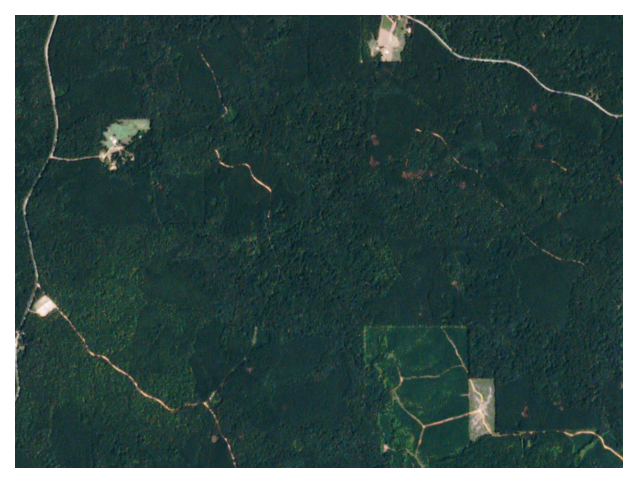

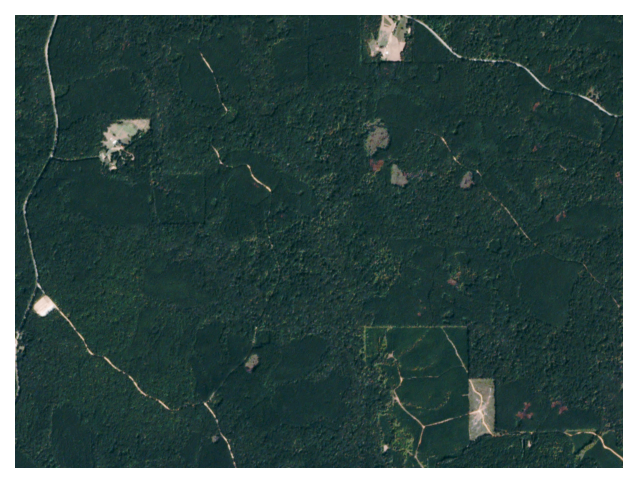

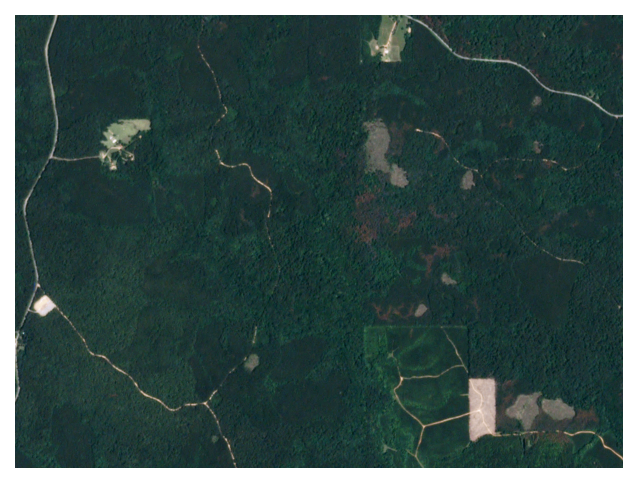

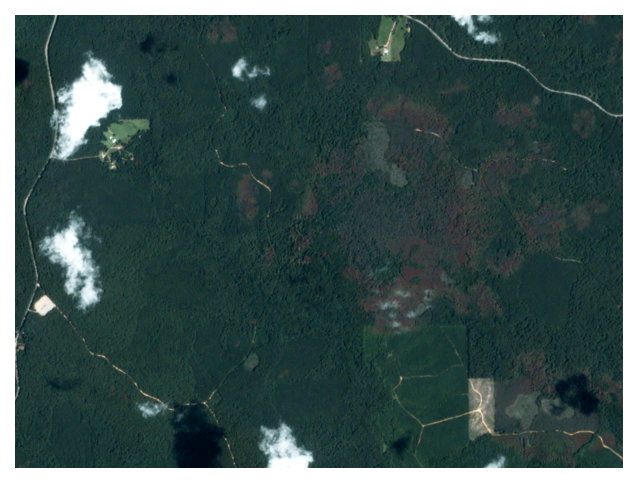

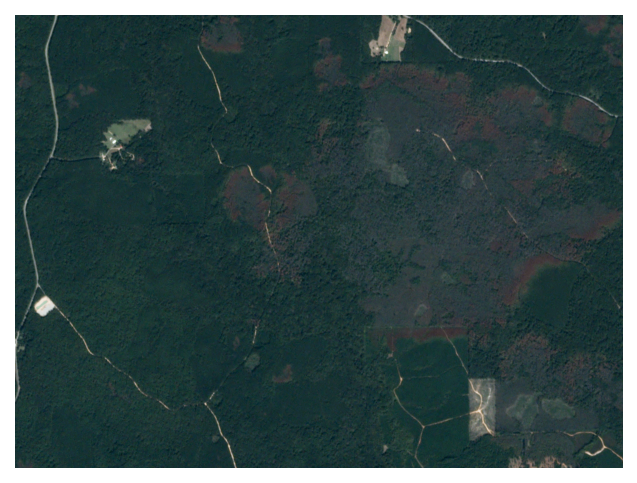

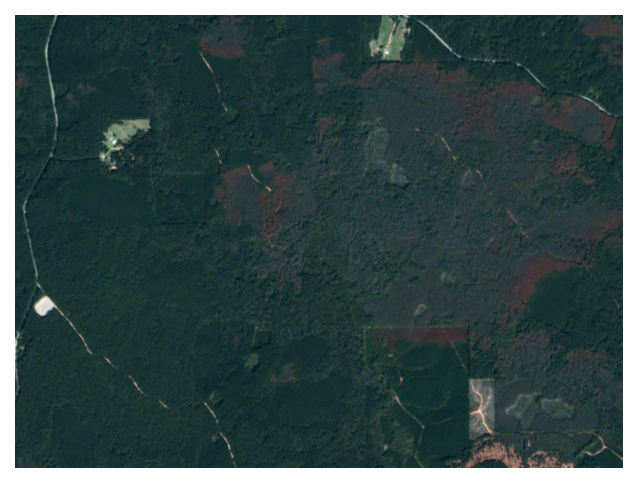

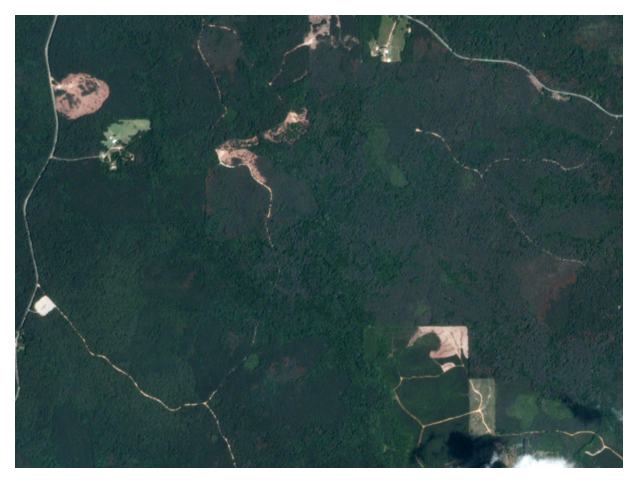

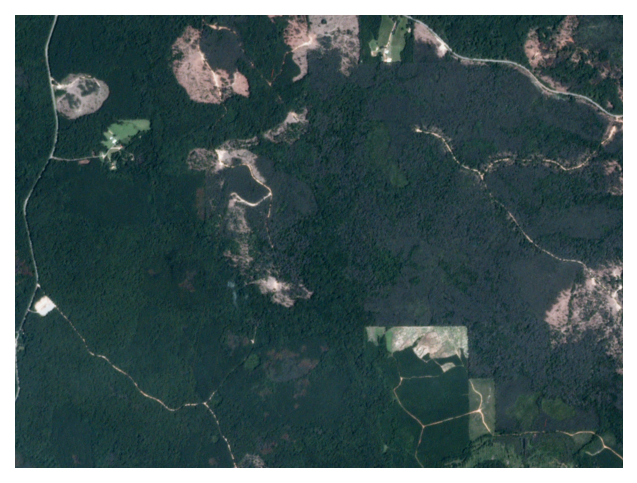

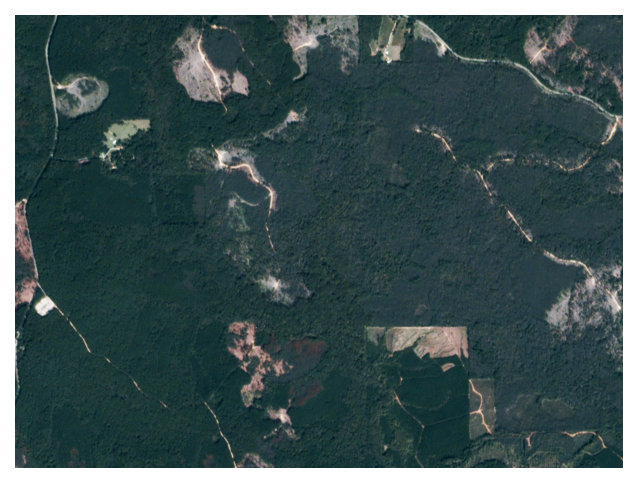

In [46]:
for image in beetle_img:
    plt.figure(dpi=150)
    plt.imshow(np.clip(image, 0, 255))
    plt.axis('off')
    plt.show()

Mean patch color before: [29.1883 53.685  51.4792]
Mean patch color after: [44.3325 58.3546 60.407 ]


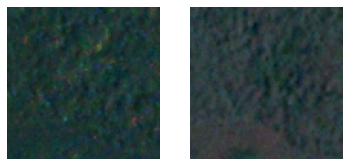

In [253]:
patch_before = beetle_img[0][500:600,1000:1100]
patch_after = beetle_img[3][500:600,1000:1100]

color_before = np.mean(patch_before, axis=(0,1))
color_after = np.mean(patch_after, axis=(0,1))
print("Mean patch color before:", color_before)
print("Mean patch color after:", color_after)

plt.subplot(1,2,1)
plt.imshow(patch_before)
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(patch_after)
plt.axis('off')
plt.show()

100%|██████████| 100/100 [00:00<00:00, 312.51it/s]


(-0.5, 99.5, 99.5, -0.5)

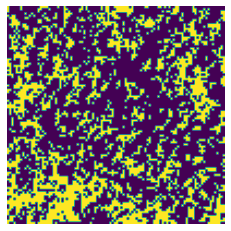

In [254]:
# iterate through all the pixels in the second image.
# if the pixel is close to the same starting color and is close to the same ending color
# the pixel is now a 1. Otherwise, pixel is a zero

from tqdm import tqdm

start_img = np.copy(beetle_img[0][500:600,1000:1100])
end_img = np.copy(beetle_img[4][500:600,1000:1100])

width, height, channels = beetle_img[0][500:600,1000:1100].shape
change_array = np.zeros((width, height))

window_size = 10

for i in tqdm(range(width)):
    for j in range(height):
        start_pixel = start_img[i,j]
        end_pixel = end_img[i,j]
        channel_match = []
        for channel in range(channels):
            if start_pixel[channel] > color_before[channel] - window_size and start_pixel[channel] < color_before[channel] + window_size:
                channel_match.append(1)
            else:
                channel_match.append(0)
        if np.array(channel_match).all() == 1:
            end_channel_match = []
            if end_pixel[channel] > color_after[channel] - window_size and end_pixel[channel] < color_after[channel] + window_size:
                end_channel_match.append(1)
            else:
                end_channel_match.append(0)
            
            if np.array(end_channel_match).all() == 1:
                change_array[i,j] = 1
plt.imshow(change_array)
plt.axis('off')

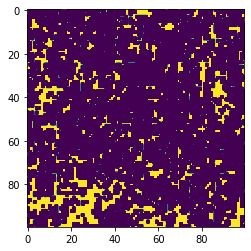

In [258]:
plt.imshow(patch_after)
plt.imshow(change_array, vmin=0.99)
plt.show()

In [227]:
color_before

array([29.1883, 53.685 , 51.4792])

In [223]:
window_size
pixel[0] > color_before[0] - window_size and pixel[0] < color_before[0] + window_size

False

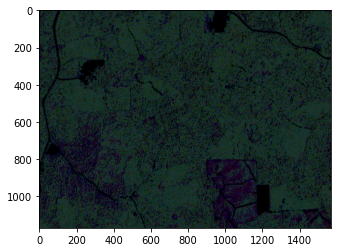

In [137]:
window_size = 10

masked = np.zeros_like(beetle_img[0])
for channel in range(3):
    img_channel = np.copy(beetle_img[0][:,:,channel])
    img_channel[img_channel < color_before[channel] - window_size] = 0
    img_channel[img_channel > color_before[channel] + window_size] = 0
    masked[:,:,channel] = img_channel
plt.imshow(masked)

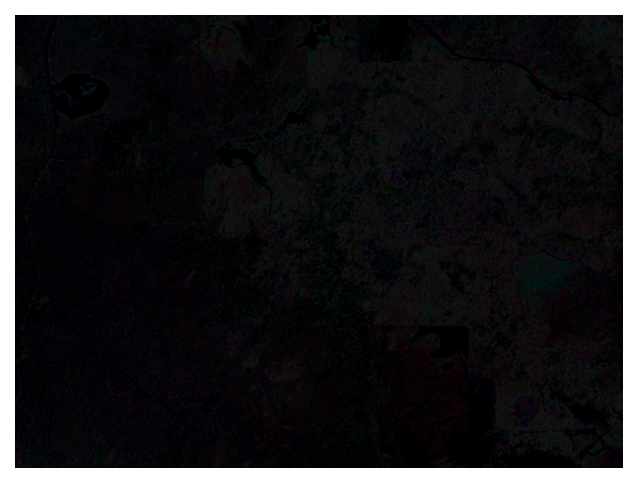

In [209]:
window_size = 20
delta_im = beetle_img[6] - beetle_img[0]
delta_color = color_after - color_before
delta_mask = np.zeros_like(beetle_img[0])
for channel in range(3):
    delta_channel = np.copy(delta_im[:,:,channel])
    delta_channel[delta_channel < delta_color[channel] - window_size] = 0
    delta_channel[delta_channel > delta_color[channel] + window_size] = 0
    delta_mask[:,:,channel] = delta_channel
plt.figure(dpi=150)
plt.imshow(delta_mask)
plt.axis('off')
plt.show()

array([[[False,  True, False],
        [False,  True, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False,  True, False],
        [False, False, False]],

       [[False,  True, False],
        [False,  True, False],
        [False,  True, False],
        ...,
        [ True,  True, False],
        [ True,  True, False],
        [ True, False,  True]],

       [[False,  True, False],
        [ True, False, False],
        [False,  True, False],
        ...,
        [False,  True, False],
        [ True, False, False],
        [ True,  True, False]],

       ...,

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False,  True,  True],
        [False,  True, False],
        [ True,  True,  True]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [ True,  True,  True],
        [False,  True,  True],
        [ True,

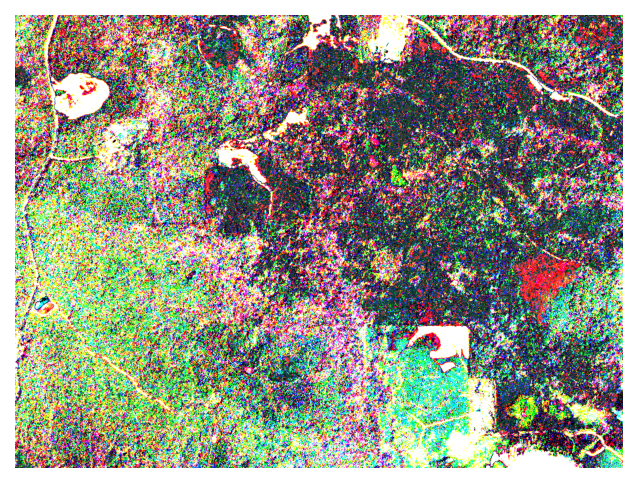

In [216]:
complete = np.copy(masked)
complete[delta_mask == 0] = 255
plt.figure(dpi=150)
plt.imshow(complete, vmin=0, vmax=255)
plt.axis('off')
plt.show()

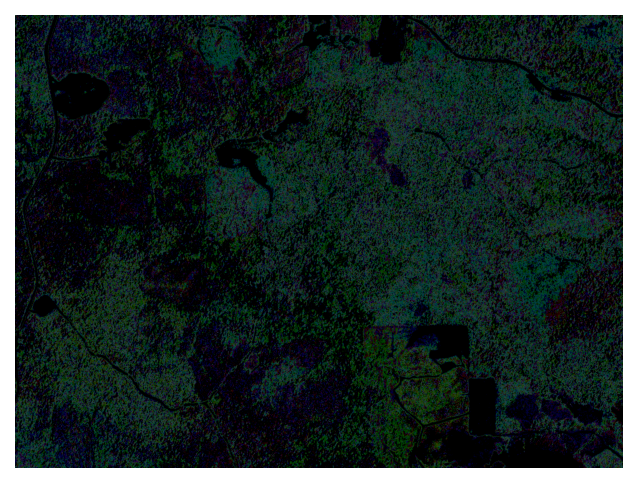

In [143]:
window_size = 3

masked = np.zeros_like(beetle_img[6])
for channel in range(3):
    img_channel = np.copy(beetle_img[6][:,:,channel])
    img_channel[img_channel < color_after[channel] - window_size] = 0
    img_channel[img_channel > color_after[channel] + window_size] = 0
    masked[:,:,channel] = img_channel
plt.figure(dpi=150)
plt.imshow(masked)
plt.axis('off')
plt.show()

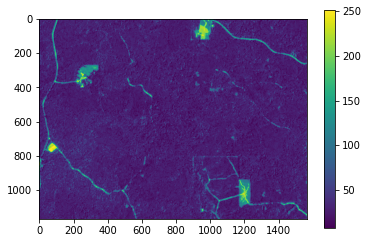

In [126]:
plt.imshow(beetle_img[0][:,:,0] < )
plt.colorbar()
plt.show()

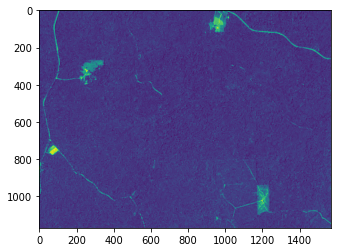

In [94]:
plt.imshow(beetle_img[0][:,:,2])

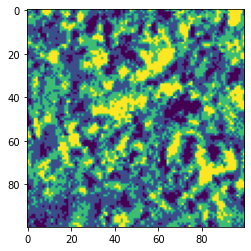

In [85]:
plt.imshow(thresholded[500:600,1000:1100])

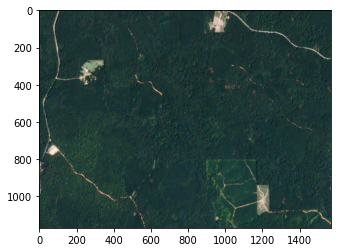

In [127]:
window_size = 10
t1 = np.ma.masked_inside(beetle_img[0][:,:,0], 
             color_before[0] - window_size, 
             color_before[0] + window_size)
t2 = np.ma.masked_inside(beetle_img[0][:,:,1], 
             color_before[1] - window_size, 
             color_before[1] + window_size)
t3 = np.ma.masked_inside(beetle_img[0][:,:,2], 
             color_before[2] - window_size, 
             color_before[2] + window_size)
thresholded = np.stack((t1,t2,t3), axis=-1).astype('int')
#thresholded = np.ma.masked_where((beetle_img[0][:,:,0] > color_before[0] - window_size) & (beetle_img[0][:,:,0] <= color_before[0] + window_size), beetle_img[0][:,:,0])
plt.imshow(np.clip(thresholded, 0, 255))
plt.show()
